In [ ]:
import os
import opensmile
import pandas as pd
import numpy as np
from natsort import natsorted
import pandas as pd
from pydub import AudioSegment as AS
from ChaFile import *
from difflib import SequenceMatcher as sm
import editdistance as ed
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn import metrics
from collections import Counter
from sentence_transformers import SentenceTransformer as ST 
from statistics import mean
from sklearn.metrics.pairwise import cosine_similarity
from sklearn import preprocessing
from tpot import TPOTClassifier, TPOTRegressor
from sklearn.model_selection import StratifiedKFold
from logging import raiseExceptions


In [28]:
smile = opensmile.Smile(
    feature_set=opensmile.FeatureSet.eGeMAPSv02, # ComParE_2016
    feature_level=opensmile.FeatureLevel.Functionals,
)
for i in smile.feature_names:
    print(i)
dir_healthy_wav = "C:\\Users\\EliKurtz\\VSCode_files\\NLP\\Kurtz-NLP\\F Healthy Audio"
# change this path to your personal pathway to audio files
dir_healthy_cha = "C:\\Users\\EliKurtz\\VSCode_files\\NLP\\Kurtz-NLP\\F Healthy CHA"

dir_AD_wav = "C:\\Users\\EliKurtz\\VSCode_files\\NLP\\Kurtz-NLP\\F AD Audio"
dir_AD_cha = "C:\\Users\\EliKurtz\\VSCode_files\\NLP\\Kurtz-NLP\\F AD CHA"

dir_MCI_wav = "C:\\Users\\EliKurtz\\VSCode_files\\NLP\\Kurtz-NLP\\F MCI Audio"
dir_MCI_cha = "C:\\Users\\EliKurtz\\VSCode_files\\NLP\\Kurtz-NLP\\F MCI CHA"



F0semitoneFrom27.5Hz_sma3nz_amean
F0semitoneFrom27.5Hz_sma3nz_stddevNorm
F0semitoneFrom27.5Hz_sma3nz_percentile20.0
F0semitoneFrom27.5Hz_sma3nz_percentile50.0
F0semitoneFrom27.5Hz_sma3nz_percentile80.0
F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2
F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope
F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope
F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope
F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope
loudness_sma3_amean
loudness_sma3_stddevNorm
loudness_sma3_percentile20.0
loudness_sma3_percentile50.0
loudness_sma3_percentile80.0
loudness_sma3_pctlrange0-2
loudness_sma3_meanRisingSlope
loudness_sma3_stddevRisingSlope
loudness_sma3_meanFallingSlope
loudness_sma3_stddevFallingSlope
spectralFlux_sma3_amean
spectralFlux_sma3_stddevNorm
mfcc1_sma3_amean
mfcc1_sma3_stddevNorm
mfcc2_sma3_amean
mfcc2_sma3_stddevNorm
mfcc3_sma3_amean
mfcc3_sma3_stddevNorm
mfcc4_sma3_amean
mfcc4_sma3_stddevNorm
jitterLocal_sma3nz_amean
jitterLocal_sma3nz_stddevNorm
shimmerLocaldB_sma3nz_amea

In [4]:
def checker(wav, cha):
    files_from_dir = os.listdir(wav)
    files_from_dir_2 = os.listdir(cha)
    if len(files_from_dir) != len(files_from_dir_2):
        quit("not equal")

checker(dir_healthy_wav, dir_healthy_cha)
checker(dir_AD_wav, dir_AD_cha)
checker(dir_MCI_wav, dir_MCI_cha)

AD_cha_files = natsorted(os.listdir(dir_AD_cha))
AD_wav_files = natsorted(os.listdir(dir_AD_wav))

MCI_cha_files = natsorted(os.listdir(dir_MCI_cha))
MCI_wav_files = natsorted(os.listdir(dir_MCI_wav))

Healthy_cha_files = natsorted(os.listdir(dir_healthy_cha))
Healthy_wav_files = natsorted(os.listdir(dir_healthy_wav))


print(len(AD_cha_files), len(MCI_cha_files),len(Healthy_cha_files))
print(len(AD_wav_files), len(MCI_wav_files),len(Healthy_wav_files))

29 30 30
29 30 30


In [5]:
COMMANDS = ["Alexa what is the weather outside ? ",
"Alexa what is today's date ? ", 
"Alexa what time is it ? ", 
"Alexa when is Thanksgiving ? ",
"Alexa how do you bake chocolate chip cookies ? ",
"Alexa what is two times four ? ",
"Alexa how many tablespoons in a cup ? ",
"Alexa how do you spell symptom ? ",
"Alexa play classical music . ",
"Alexa volume eight . ", 
"Alexa play jazz . ",
"Alexa volume six . ",
"Alexa stop . ",
"Alexa remind me to start the laundry tomorrow at two p_m . ",
"Alexa remind me to feed the dog at seven p_m everyday . ",
"Alexa tell me my reminders . ",
"Alexa remember my daughter's birthday is June first . ", 
"Alexa set a timer in five seconds . ",
"Alexa set my alarm for seven a_m tomorrow . ",
"Alexa add oranges and grapes to my shopping list . ",
"Alexa what is in my shopping list ? ",
"Alexa call six zero three six six zero two two zero three . ",
"Alexa hang up . ",
"Alexa find my phone . ",
"Alexa quit . ",
"Alexa turn the bedroom light on . ",
"Alexa turn the bedroom light red . ",
"Alexa change brightness to ten . ",
"Alexa turn off the bedroom light . ",
"Alexa open the kitchen camera . ",
"Alexa hide the kitchen camera . ",
"Alexa play white collar on fire tv . ",
"Alexa pause . ",
"yes . "]


In [6]:
model = ST('bert-base-nli-mean-tokens')
# this is a pretained encoder... need to download if not done already
SENTENCE_EMBEDDINGS = model.encode(COMMANDS)

In [7]:
BASIC = []
UNIQUE = []

ad_moca = [10, 22, 13, 16, 11, 13, 10, 17, 2, 12, 21, 11, 6, 14, 3, 16, 15, 21, 14, 14, 22, 21, 16, 23, 11, 15, 16, 15, 20]
mci_moca = [20, 24, 25, 23, 23, 22, 24, 24, 25, 21, 25, 24, 17, 24, 24, 25, 24, 23, 24, 25, 25, 23, 25, 25, 19, 24, 25, 20, 25, 25]
healthy_moca = [26, 26, 29, 28, 30, 28, 28, 30, 27, 26, 27, 26, 27, 28, 26, 27, 30, 27, 26, 27, 27, 26, 26, 29, 28, 26, 28, 26, 29, 26]
# measurement of cognitive function: lower = AD

print(len(ad_moca),len(mci_moca), len(healthy_moca))

29 30 30


In [22]:
class Utterance:

    def __init__(self, utter):
        self.utter = utter


    def closest_wrd(self):
        # letter error rate distance
        dist_list = []
        for com in COMMANDS:
            dist_list.append([com, ed.eval(com, self.utter), self.utter])
        min_list = []
        for i in dist_list:
            min_list.append(i[1])
        minimum = min(min_list)
        min_index_commands = min_list.index(minimum)
        # print(min_index_commands) to debug
        return dist_list[min_index_commands]


    def closest_bert(self):
        # trying to capture intent
        utty = model.encode(self.utter)
        sim = cosine_similarity([utty], SENTENCE_EMBEDDINGS)
        sim_list = sim[0].tolist()
        max_sim = max(sim_list)
        max_index = sim_list.index(max_sim)
        return [COMMANDS[max_index], max_sim, self.utter]


def prepare_svm_data(df, participant, is_exact, unique_feature_set, fs1):
    # just to prepare the data by flattening it.
    catcher_bert = []
    catcher_wrd = []
    for index, row in df.iterrows():
        bert_metric = row["BERT Metric"]
        wrd_metric = row["WRD Metric"]
        catcher_bert.append(float(bert_metric))
        catcher_wrd.append(int(wrd_metric))
    catcher_combine_unique = catcher_bert + catcher_wrd 
    catcher_combine_fs1 = catcher_bert + catcher_wrd + is_exact
    unique_feature_set.append(catcher_combine_unique)
    fs1.append(catcher_combine_fs1)    



def categorize(cha_dir, cha_file, basic_feature_set, unique_feature_set, fs1):
    os.chdir(cha_dir)
    df = pd.DataFrame()
    cha = ChaFile(cha_file)
    lines = cha.getLines()
    master_list_wrd = []
    master_list_bert = []
    bert_match = []
    wrd_match = []
    ur_list = []
    close_bert_metric = []
    close_wrd_metric = []
    exact_matches = []
    for data in lines:
        utterance = data["xol"]
        if "[" in utterance:
            ur_list.append(utterance)
        else:
            if utterance in COMMANDS:
                exact_matches.append(utterance)
            else:
                utterance = Utterance(utterance)
                master_list_wrd.append(utterance.closest_wrd())
                master_list_bert.append(utterance.closest_bert())
    for _ in master_list_bert:
        bert_match.append(_[0])
    for _ in master_list_wrd:
        wrd_match.append(_[0])
    dct_bert = {}
    dct_wrd = {}
    dct_bert_metric = {}
    dct_wrd_metric = {}
    bert_col = []
    wrd_col = []
    for j in bert_match:
        dct_bert[j] = [i for i, x in enumerate(bert_match) if x == j]
    for j in wrd_match:
        dct_wrd[j] = [i for i, x in enumerate(wrd_match) if x == j]
    wrd_missing = 0
    bert_missing = 0
    is_exact = []
    for com in COMMANDS:
        if com in exact_matches:
            is_exact.append(1)
            wrd_col.append("Exact")
            close_wrd_metric.append(0)
            bert_col.append("Exact")
            close_bert_metric.append(1)
        if com not in exact_matches:
            is_exact.append(0)
            if com not in wrd_match:
                wrd_col.append("Missing")
                close_wrd_metric.append(len(com))
                wrd_missing += 1
            if com not in bert_match:
                bert_col.append("Missing")
                close_bert_metric.append(0)
                bert_missing += 1
        # Problems below with adding multiple commands
        if com in wrd_match and com not in exact_matches:
            multi_utter = []
            average_wrd = []
            for utter_index in dct_wrd[com]:
                multi_utter.append(master_list_wrd[utter_index][2])
                average_wrd.append(master_list_wrd[utter_index][1])
            wrd_col.append(multi_utter)
            close_wrd_metric.append(np.mean(average_wrd))
        if com in bert_match and com not in exact_matches:
            multi_utter = []
            average_bert = []
            for utter_index in dct_bert[com]:
                multi_utter.append(master_list_bert[utter_index][2])
                average_bert.append(master_list_bert[utter_index][1])
            bert_col.append(multi_utter)
            close_bert_metric.append(np.mean(average_bert))
    df["Commands"] = COMMANDS
    df["BERT Match"] = bert_col
    df["BERT Metric"] = close_bert_metric
    df["WRD Match"] = wrd_col
    df["WRD Metric"] = close_wrd_metric
    df["Is Exact"] = is_exact
    is_exact.append(len(ur_list))
    basic_feature_set.append(is_exact)
    prepare_svm_data(df, cha_file, is_exact, unique_feature_set, fs1)
    print(len(ur_list), ur_list)
    print(df)

    #uncomment this to create a new excel file 

    #os.chdir("..")
    #with pd.ExcelWriter("alexa_is_exact2.xlsx", mode="a", engine="openpyxl") as writer:
        #df.to_excel(writer, sheet_name=cha_file)    
        


In [ ]:
FEATURE_SET_1 = []


for i in range(len(AD_cha_files)):
    categorize(dir_AD_cha, AD_cha_files[i], BASIC, UNIQUE, FEATURE_SET_1)

for i in range(len(MCI_cha_files)):
    categorize(dir_MCI_cha, MCI_cha_files[i], BASIC, UNIQUE, FEATURE_SET_1)

for i in range(len(Healthy_cha_files)):
    categorize(dir_healthy_cha, Healthy_cha_files[i],  BASIC, UNIQUE, FEATURE_SET_1)

# ^^^ KEEP THIS ORDER FOR ASSEMBELING OTHER FEATURE SETS!! ^^^

# Assembling individual class feature sets 

In [29]:
# openSmile extraction

def extract(directory):
    files_from_dir = os.listdir(directory)
    os.chdir(directory)
    g_features = []
    for i in files_from_dir:
        y = smile.process_file(i)
        g_features.append(y.values.flatten().tolist())
    return g_features

healthy_fs_3 = extract(dir_healthy_wav)
print(healthy_fs_3)
ad_fs_3 = extract(dir_AD_wav)
mci_fs_3 = extract(dir_MCI_wav)
gemaps_features = ad_fs_3 + mci_fs_3 + healthy_fs_3
ACOUSTIC = gemaps_features

[[36.40923309326172, 0.0972541868686676, 33.852256774902344, 36.272796630859375, 39.373653411865234, 5.521396636962891, 98.02642059326172, 169.74331665039062, 70.8488998413086, 159.224609375, 0.5823240280151367, 0.8429471254348755, 0.11216039955615997, 0.44900399446487427, 1.0261776447296143, 0.9140172600746155, 8.693999290466309, 5.6382975578308105, 4.702544689178467, 2.795118570327759, 0.35397592186927795, 1.084875464439392, 27.36298370361328, 0.43484047055244446, 8.26845932006836, 1.6999874114990234, 5.449958801269531, 2.7703731060028076, 0.20422032475471497, 74.85233306884766, 0.02049976773560047, 1.368101954460144, 1.1801128387451172, 0.6315864324569702, 8.821797370910645, 0.381279319524765, 12.2197847366333, 1.007484793663025, 27.21706771850586, 0.49579909443855286, 709.262939453125, 0.3536214828491211, 1387.9019775390625, 0.18658652901649475, -92.78945922851562, -0.9548128843307495, 1756.031982421875, 0.13946127891540527, 1115.2955322265625, 0.3027384877204895, -88.9421920776367

In [10]:
hubert_dir_AD = "C:\\Users\\EliKurtz\\VSCode_files\\NLP\\Kurtz-NLP\\HuBERT\\HuBERT AD"
#replace these files paths with your own
hubert_dir_MCI = "C:\\Users\\EliKurtz\\VSCode_files\\NLP\\Kurtz-NLP\\HuBERT\\HuBERT MCI"
hubert_dir_Healthy = "C:\\Users\\EliKurtz\\VSCode_files\\NLP\\Kurtz-NLP\\HuBERT\\HuBERT Healthy"

hubert_files_ad = natsorted(os.listdir(hubert_dir_AD))
hubert_files_mci = natsorted(os.listdir(hubert_dir_MCI))
hubert_files_healthy = natsorted(os.listdir(hubert_dir_Healthy))

In [11]:
def get_load(hubert_files, hubert_dir):
    os.chdir(hubert_dir)
    names = []
    numbers = []
    for i in range(len(hubert_files)):
        index_participant = hubert_files[i].find("participant")
        participant = hubert_files[i][index_participant:]
        participant = participant.split("_")
        participant = participant[0]
        numbers.append(np.load(hubert_files[i]))
        names.append(participant)
    if len(names) != len(numbers):
        raise Exception("invalid lengths")
    names_nums = []
    for i in range(len(names)):
        mini_list = []
        mini_list.append(names[i])
        mini_list.append(numbers[i])
        names_nums.append(mini_list)
    set_names = natsorted(set(names))
    overall = []
    for name in set_names:
        divi = []
        for pair in names_nums:
            if pair[0] == name:
                divi.append(pair[1])
        overall.append(divi)
    avg_hubert_participant =[]
    for i in overall:
        avg_hubert_participant.append(np.mean(i, axis=0).flatten().tolist())
    return(avg_hubert_participant)
    

ad_hubert_average = get_load(hubert_files_ad, hubert_dir_AD)
mci_hubert_average = get_load(hubert_files_mci, hubert_dir_MCI)
healthy_hubert_average = get_load(hubert_files_healthy, hubert_dir_Healthy)
HUBERT_FEATURES = ad_hubert_average + mci_hubert_average + healthy_hubert_average

In [12]:
def flatten_combine_features (input_1, input_2, output):
    if len(input_1) == len(input_2):
        for i in range(len(input_1)):
            new = input_1[i] + input_2[i]
            output.append(new)
    else:
        print("ERROR!")

FEATURE_SET_2 = []
FEATURE_SET_3 = []
flatten_combine_features(FEATURE_SET_1, ACOUSTIC, FEATURE_SET_2)
flatten_combine_features(FEATURE_SET_1, HUBERT_FEATURES, FEATURE_SET_3)


In [13]:
normalized_BASIC = preprocessing.normalize(BASIC)
normalized_UNIQUE = preprocessing.normalize(UNIQUE)
normalized_ACOUSTIC = preprocessing.normalize(ACOUSTIC)
# HuBERT doesnt need normalizing
normalized_FS_1 = preprocessing.normalize(FEATURE_SET_1)
normalized_FS_2 = preprocessing.normalize(FEATURE_SET_2)
normalized_FS_3 = preprocessing.normalize(FEATURE_SET_3)


In [14]:
# working with regression on MoCA scores

labels = []
ad_labels = []
mci_labels = []
healthy_labels = []
for i in range(len(AD_cha_files)):
    ad_labels.append("AD")
    labels.append("AD")
for i in range(len(MCI_cha_files)):
    mci_labels.append("MCI")
    labels.append("MCI")
for i in range(len(Healthy_cha_files)):
    healthy_labels.append("Healthy")
    labels.append("Healthy")

regression_labels = ad_moca + mci_moca + healthy_moca


In [15]:
#Classification sets (only needed for developing models, i.e. TPOT)

f_train_basic, f_test_basic, l_train_basic, l_test_basic = train_test_split(normalized_BASIC, labels, test_size=0.33, random_state=2022)
f_train_unique, f_test_unique, l_train_unique, l_test_unique = train_test_split(normalized_UNIQUE, labels, test_size=0.33, random_state=2022)
f_train_acoustic, f_test_acoustic, l_train_acoustic, l_test_acoustic = train_test_split(normalized_ACOUSTIC, labels, test_size=0.33, random_state=2022)
f_train_1, f_test_1, l_train_1, l_test_1 = train_test_split(normalized_FS_1, labels, test_size=0.33, random_state=2022)
f_train_2, f_test_2, l_train_2, l_test_2 = train_test_split(normalized_FS_2, labels, test_size=0.33, random_state=2022)
f_train_3, f_test_3, l_train_3, l_test_3 = train_test_split(normalized_FS_3, labels, test_size=0.33, random_state=2022)
f_hubert_train, f_hubert_test, l_hubert_train, l_hubert_test = train_test_split(HUBERT_FEATURES, labels, test_size=0.33, random_state=2022)

training_data_full = [ [f_train_basic, l_train_basic], [f_train_unique, l_train_unique], [f_train_acoustic, l_train_acoustic],\
     [f_train_1, l_train_1], [f_train_2, l_train_2], [f_train_3, l_train_3], [f_hubert_train, l_hubert_train]]

In [16]:
#Regression sets (only needed for developing models, i.e. TPOT)

r_train_basic, r_test_basic, moca_train_basic, moca_test_basic = train_test_split(normalized_BASIC, regression_labels, test_size=0.33, random_state=2022)
r_train_unique, r_test_unique, moca_train_unique, moca_test_unique = train_test_split(normalized_UNIQUE, regression_labels, test_size=0.33, random_state=2022)
r_train_acoustic, r_test_acoustic, moca_train_acoustic, moca_test_acoustic = train_test_split(normalized_ACOUSTIC, regression_labels, test_size=0.33, random_state=2022)
r_train_1, r_test_1, moca_train_1, moca_test_1 = train_test_split(normalized_FS_1, regression_labels, test_size=0.33, random_state=2022)
r_train_2, r_test_2, moca_train_2, moca_test_2 = train_test_split(normalized_FS_2, regression_labels, test_size=0.33, random_state=2022)
r_train_3, r_test_3, moca_train_3, moca_test_3 = train_test_split(normalized_FS_3, regression_labels, test_size=0.33, random_state=2022)
r_hubert_train, r_hubert_test, moca_hubert_train, moca_hubert_test = train_test_split(HUBERT_FEATURES, regression_labels, test_size=0.33, random_state=2022)

training_data_full_regression = [ [r_train_basic, moca_train_basic], [r_train_unique, moca_train_unique], [r_train_acoustic, moca_train_acoustic],\
     [r_train_1, moca_train_1], [r_train_2, moca_train_2], [r_train_3, moca_train_3], [r_hubert_train, moca_hubert_train]]

In [17]:
feature_sets = [BASIC, UNIQUE, ACOUSTIC, FEATURE_SET_1, FEATURE_SET_2, FEATURE_SET_3, HUBERT_FEATURES]

def combine_into_binary_sets(fs1, fs2, label1, label2):
    features_out = fs1 + fs2
    labels_out = label1 + label2
    if len(features_out) != len(labels_out):
        print("ERROR")   
    return features_out, labels_out


def split_into_classes(feature_set):
    ad_features = feature_set[:29]
    mci_features = feature_set[29:59]
    hc_features = feature_set[59:]
    return ad_features, mci_features, hc_features


ad_basic, mci_basic, hc_basic = split_into_classes(BASIC)
ad_unique, mci_unique, hc_unique = split_into_classes(UNIQUE)
ad_acoustic, mci_acoustic, hc_acoustic = split_into_classes(ACOUSTIC)
ad_fs1, mci_fs1, hc_fs1 = split_into_classes(FEATURE_SET_1)
ad_fs2, mci_fs2, hc_fs2 = split_into_classes(FEATURE_SET_2)
ad_fs3, mci_fs3, hc_fs3 = split_into_classes(FEATURE_SET_3)
ad_hubert, mci_hubert, hc_hubert = split_into_classes(HUBERT_FEATURES)


In [18]:
avh_basic_feature, avh_basic_labels = combine_into_binary_sets(ad_basic, hc_basic, ad_labels, healthy_labels)
#avh = alzheimers vs healthy

avm_basic_feature, avm_basic_labels = combine_into_binary_sets(ad_basic, mci_basic, ad_labels, mci_labels)
#avm = alzheimers vs MCI

mvh_basic_feature, mvh_basic_labels = combine_into_binary_sets(mci_basic, hc_basic, mci_labels, healthy_labels)

avh_unique_feature, avh_unique_labels = combine_into_binary_sets(ad_unique, hc_unique, ad_labels, healthy_labels)
avm_unique_feature, avm_unique_labels = combine_into_binary_sets(ad_unique, mci_unique, ad_labels, mci_labels)
mvh_unique_feature, mvh_unique_labels = combine_into_binary_sets(mci_unique, hc_unique, mci_labels, healthy_labels)

avh_acoustic_feature, avh_acoustic_labels = combine_into_binary_sets(ad_acoustic, hc_acoustic, ad_labels, healthy_labels)
avm_acoustic_feature, avm_acoustic_labels = combine_into_binary_sets(ad_acoustic, mci_acoustic, ad_labels, mci_labels)
mvh_acoustic_feature, mvh_acoustic_labels = combine_into_binary_sets(mci_acoustic, hc_acoustic, mci_labels, healthy_labels)

avh_fs1_feature, avh_fs1_labels = combine_into_binary_sets(ad_fs1, hc_fs1, ad_labels, healthy_labels)
avm_fs1_feature, avm_fs1_labels = combine_into_binary_sets(ad_fs1, mci_fs1, ad_labels, mci_labels)
mvh_fs1_feature, mvh_fs1_labels = combine_into_binary_sets(mci_fs1, hc_fs1, mci_labels, healthy_labels)

avh_fs2_feature, avh_fs2_labels = combine_into_binary_sets(ad_fs2, hc_fs2, ad_labels, healthy_labels)
avm_fs2_feature, avm_fs2_labels = combine_into_binary_sets(ad_fs2, mci_fs2, ad_labels, mci_labels)
mvh_fs2_feature, mvh_fs2_labels = combine_into_binary_sets(mci_fs2, hc_fs2, mci_labels, healthy_labels)

avh_fs3_feature, avh_fs3_labels = combine_into_binary_sets(ad_fs3, hc_fs3, ad_labels, healthy_labels)
avm_fs3_feature, avm_fs3_labels = combine_into_binary_sets(ad_fs3, mci_fs3, ad_labels, mci_labels)
mvh_fs3_feature, mvh_fs3_labels = combine_into_binary_sets(mci_fs3, hc_fs3, mci_labels, healthy_labels)

avh_hubert_feature, avh_hubert_labels = combine_into_binary_sets(ad_hubert, hc_hubert, ad_labels, healthy_labels)
avm_hubert_feature, avm_hubert_labels = combine_into_binary_sets(ad_hubert, mci_hubert, ad_labels, mci_labels)
mvh_hubert_feature, mvh_hubert_labels = combine_into_binary_sets(mci_hubert, hc_hubert, mci_labels, healthy_labels)

binary_model_features = [avh_basic_feature, avm_basic_feature, mvh_basic_feature, avh_unique_feature, avm_unique_feature, mvh_unique_feature, \
    avh_acoustic_feature, avm_acoustic_feature, mvh_acoustic_feature, avh_fs1_feature, avm_fs1_feature, mvh_fs1_feature, \
        avh_fs2_feature, avm_fs2_feature, mvh_fs2_feature, avh_fs3_feature, avm_fs3_feature, mvh_fs3_feature, \
            avh_hubert_feature, avm_hubert_feature, mvh_hubert_feature]

binary_model_labels = [avh_basic_labels, avm_basic_labels, mvh_basic_labels, avh_unique_labels, \
    avm_unique_labels, mvh_unique_labels, avh_acoustic_labels, avm_acoustic_labels, mvh_acoustic_labels, avh_fs1_labels, \
        avm_fs1_labels, mvh_fs1_labels, avh_fs2_labels, avm_fs2_labels, mvh_fs2_labels, avh_fs3_labels, avm_fs3_labels, \
            mvh_fs3_labels, avh_hubert_labels, avm_hubert_labels, mvh_hubert_labels]

binary_class_labels = [["AD", "Healthy"], ["AD", "MCI"],  ["MCI", "Healthy"], ["AD", "Healthy"], ["AD", "MCI"],  ["MCI", "Healthy"], \
    ["AD", "Healthy"],  ["AD", "MCI"],  ["MCI", "Healthy"], ["AD", "Healthy"], ["AD", "MCI"],  ["MCI", "Healthy"], \
        ["AD", "Healthy"], ["AD", "MCI"],  ["MCI", "Healthy"], ["AD", "Healthy"], ["AD", "MCI"],  ["MCI", "Healthy"], \
            ["AD", "Healthy"], ["AD", "MCI"],  ["MCI", "Healthy"] ]

binary_class_features = ["Basic", "Basic", "Basic", "Unique", "Unique", "Unique", "Acoustic", "Acoustic", "Acoustic", \
    "FS1", "FS1", "FS1", "FS2", "FS2", "FS2", "FS3", "FS3", "FS3", "HuBERT", "HuBERT", "HuBERT"]


In [19]:
avh_train, avh_test, avh_train_labels, \
    avh_test_labels = train_test_split(avh_fs3_feature, avh_fs3_labels, test_size=0.33, random_state=2022)

avm_train, avm_test, avm_train_labels, \
    avm_test_labels = train_test_split(avm_fs3_feature, avm_fs3_labels, test_size=0.33, random_state=2022)

mvh_train, mvh_test, mvh_train_labels, \
    mvh_test_labels = train_test_split(mvh_hubert_feature, mvh_hubert_labels, test_size=0.33, random_state=2022)


training_data_full_binary = [ [avh_train, avh_train_labels], \
    [avm_train, avm_train_labels], [mvh_train, mvh_train_labels] ]

In [33]:
import numpy as np
import pandas as pd
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectFwe, f_classif
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline, make_union
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import FunctionTransformer
from copy import copy
from sklearn.feature_selection import RFE
from sklearn.naive_bayes import GaussianNB
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import Normalizer
from sklearn.feature_selection import RFE
from sklearn.kernel_approximation import RBFSampler
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import MaxAbsScaler
from sklearn.svm import LinearSVC
from sklearn.linear_model import RidgeCV
from sklearn.neighbors import KNeighborsRegressor
from tpot.builtins import OneHotEncoder, StackingEstimator, ZeroCount
from sklearn.metrics import mean_squared_error as mse
from matplotlib import pyplot as plt
import itertools
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.cluster import FeatureAgglomeration
from sklearn.tree import DecisionTreeClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.preprocessing import Binarizer
import math
from sklearn.model_selection import KFold
from sklearn.feature_selection import r_regression
from sklearn.feature_selection import SelectPercentile
from sklearn.decomposition import PCA
from sklearn.linear_model import SGDClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import FastICA
from sklearn.preprocessing import MinMaxScaler
from sklearn.kernel_approximation import Nystroem
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [55]:
BEST_SCORES_AD = []
BEST_SCORES_MCI = []
BEST_SCORES_HEALHTY = []


def get_score(model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    fitted = model.predict(X_test)
    return metrics.accuracy_score(y_test, fitted), metrics.precision_score(y_test, fitted, average="macro", zero_division=0), \
        metrics.recall_score(y_test, fitted, average="macro", zero_division=0), fitted


def get_mse(model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    fitted = model.predict(X_test)
    return mse(y_test, fitted)


def kfold_and_score(features, labels, model, class_labels, splits:int, reps:int, model_name):
    scores = []
    actual_targets = []
    predicted_targets = []
    precisions = []
    recalls = []
    folds = StratifiedKFold(n_splits=splits, shuffle=True, random_state=2022)
    for _ in range(reps):
        for train_index, test_index in folds.split(features, labels):
            X_train, X_test, y_train, y_test = np.array(features)[train_index], np.array(features)[test_index], \
                np.array(labels)[train_index], np.array(labels)[test_index]
            score, precision, recall, predicted = get_score(model, X_train, X_test, y_train, y_test)
            precisions.append(precision)
            recalls.append(recall)
            scores.append(score)
            actual_targets.append(y_test.tolist())
            predicted_targets.append(predicted.tolist())
        flat_predicted_targets = [item for sublist in predicted_targets for item in sublist]
        flat_actual_targets = [item for sublist in actual_targets for item in sublist]
    # print(len(flat_predicted_targets), len(flat_actual_targets))
    plot_confusion_matrix(flat_predicted_targets, flat_actual_targets, class_labels, model_name)
    print(mean(scores), "accuracy")
    print(mean(precisions), "precision")
    print(mean(recalls), "recall")


def kfold_and_mse(features, labels, model, splits:int, reps:int):
    r = []
    scores = []
    actual_targets = []
    predicted_targets = []
    folds = KFold(n_splits=splits, shuffle=True, random_state=2022)
    for _ in range(reps):
        for train_index, test_index in folds.split(features, labels):
            X_train, X_test, y_train, y_test = np.array(features)[train_index], np.array(features)[test_index], \
                np.array(labels)[train_index], np.array(labels)[test_index]
            score = get_mse(model, X_train, X_test, y_train, y_test)
            scores.append(score)
    print(scores, "MSE: ", mean(scores))
    print("RMSE: ", math.sqrt(mean(scores)))


def generate_confusion_matrix(cnf_matrix, model_name, classes, normalize=False, title='', ):
    if normalize:
        cnf_matrix = cnf_matrix.astype('float') / cnf_matrix.sum(axis=1)[:, np.newaxis]
        # find_best(cnf_matrix, model_name)
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
    plt.imshow(cnf_matrix, interpolation='nearest', cmap=plt.get_cmap('Blues'))
    plt.title(title)
    plt.colorbar()

    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45, fontsize = "x-large")
    plt.yticks(tick_marks, classes, fontsize = "x-large")

    fmt = '.2f' if normalize else 'd'
    thresh = cnf_matrix.max() / 2.

    for i, j in itertools.product(range(cnf_matrix.shape[0]), range(cnf_matrix.shape[1])):
        plt.text(j, i, format(cnf_matrix[i, j], fmt), horizontalalignment="center",
                 color="white" if cnf_matrix[i, j] > thresh else "black",\
                     fontsize = "x-large") 

    plt.tight_layout()
    plt.ylabel('True label', fontsize = "x-large")
    plt.xlabel('Predicted label', fontsize = "x-large")

    return cnf_matrix


def plot_confusion_matrix(predicted_labels_list, y_test_list, class_labels, model_name):

    cnf_matrix = confusion_matrix(y_test_list, predicted_labels_list)
    print(cnf_matrix)
    np.set_printoptions(precision=2)

    # Plot non-normalized confusion matrix
    plt.figure()
    generate_confusion_matrix(cnf_matrix, model_name, classes=class_labels)
    plt.show()

    # Plot normalized confusion matrix
    plt.figure()
    generate_confusion_matrix(cnf_matrix, model_name, classes=class_labels, normalize=True)
    plt.show()


def find_best(matrix, model_name):
    #Investigate whether this still works for your data since it might be differnet scoring
    if len(matrix) > 2:
        matrix_df = pd.DataFrame(matrix)
        ad = matrix_df[0][0]
        mci = matrix_df[1][1]
        healthy = matrix_df[2][2]

        BEST_SCORES_AD.append([ad, model_name])
        BEST_SCORES_MCI.append([mci, model_name])
        BEST_SCORES_HEALHTY.append([healthy, model_name])
    else: 
        return


dt_model = DecisionTreeClassifier(criterion="gini", max_depth=3, min_samples_leaf=9, min_samples_split=9)

lda_model = LinearDiscriminantAnalysis()

svm_model = LinearSVC(C=0.1, dual=True, loss="squared_hinge", penalty="l2", tol=0.001)

nn_model = KNeighborsClassifier(n_neighbors=1)

rf_model = RandomForestClassifier()

tpot_basic_model = make_pipeline(
    make_union(
        FastICA(tol=0.15000000000000002, max_iter=6000),
        FunctionTransformer(copy)
    ),
    DecisionTreeClassifier(criterion="gini", max_depth=5, min_samples_leaf=7, min_samples_split=18)
)

tpot_unique_model = make_pipeline(
    SelectPercentile(score_func=f_classif, percentile=90),
    Normalizer(norm="max"),
    ExtraTreesClassifier(bootstrap=True, criterion="entropy", max_features=0.3, min_samples_leaf=8, min_samples_split=8, n_estimators=100)
)

tpot_acoustic_model = make_pipeline(
    make_union(
        MinMaxScaler(),
        RBFSampler(gamma=0.8500000000000001)
    ),
    LinearSVC(C=10.0, dual=False, loss="squared_hinge", penalty="l2", tol=0.1)
)

tpot_fs1_model = make_pipeline(
    SelectPercentile(score_func=f_classif, percentile=8),
    ExtraTreesClassifier(bootstrap=False, criterion="gini", max_features=0.5, min_samples_leaf=7, min_samples_split=20, n_estimators=100)
)

tpot_fs2_model = make_pipeline(
    SelectFwe(score_func=f_classif, alpha=0.019),
    PCA(iterated_power=4, svd_solver="randomized"),
    SelectFwe(score_func=f_classif, alpha=0.003),
    DecisionTreeClassifier(criterion="gini", max_depth=10, min_samples_leaf=7, min_samples_split=10)
)

tpot_fs3_model = make_pipeline(
    SelectFwe(score_func=f_classif, alpha=0.011),
    KNeighborsClassifier(n_neighbors=21, p=2, weights="distance")
)

tpot_hubert_model = make_pipeline(
    make_union(
        FunctionTransformer(copy),
        FunctionTransformer(copy)
    ),
    StandardScaler(),
    SGDClassifier(alpha=0.001, eta0=0.01, fit_intercept=True, l1_ratio=0.25, learning_rate="constant", loss="hinge", penalty="elasticnet", power_t=10.0)
)

tpot_binary_avh_model =  LinearSVC(C=20.0, dual=True, loss="squared_hinge", penalty="l2", tol=0.0001)

tpot_binary_avm_model = ExtraTreesClassifier(bootstrap=True, criterion="entropy", max_features=0.3, \
    min_samples_leaf=5, min_samples_split=11, n_estimators=100)

tpot_binary_mvh_model = make_pipeline(
    Nystroem(gamma=0.55, kernel="polynomial", n_components=3),
    SGDClassifier(alpha=0.001, eta0=1.0, fit_intercept=True, l1_ratio=0.0, learning_rate="invscaling", \
        loss="hinge", penalty="elasticnet", power_t=1.0, max_iter=60000)
)



models = [dt_model, lda_model, svm_model, nn_model, rf_model]

tpot_models = [tpot_basic_model, tpot_unique_model, tpot_acoustic_model, tpot_fs1_model, \
    tpot_fs2_model, tpot_fs3_model, tpot_hubert_model]

# Decision time... do I use the same madel to categorize all features sets? Perhaps I should so that the results are standardized...
# But also this would give lower accuracy figures...
# How to evaluate the best ml model across multiple datasets?
# --> deciding to use repeated k-fold validation k=10 x 10 Reps = 100 fitted models

splits = 10


**Multi-Classification:**

Pipeline(steps=[('selectpercentile', SelectPercentile(percentile=8)),
                ('extratreesclassifier',
                 ExtraTreesClassifier(max_features=0.5, min_samples_leaf=7,
                                      min_samples_split=20))]) Basic tpot


c:\Users\EliKurtz\VSCode_files\NLP\Kurtz-NLP\lib\site-packages\sklearn\decomposition\_fastica.py:488: FutureWarning: From version 1.3 whiten='unit-variance' will be used by default.
  warnings.warn(
c:\Users\EliKurtz\VSCode_files\NLP\Kurtz-NLP\lib\site-packages\sklearn\decomposition\_fastica.py:120: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(
c:\Users\EliKurtz\VSCode_files\NLP\Kurtz-NLP\lib\site-packages\sklearn\decomposition\_fastica.py:488: FutureWarning: From version 1.3 whiten='unit-variance' will be used by default.
  warnings.warn(
c:\Users\EliKurtz\VSCode_files\NLP\Kurtz-NLP\lib\site-packages\sklearn\decomposition\_fastica.py:488: FutureWarning: From version 1.3 whiten='unit-variance' will be used by default.
  warnings.warn(
c:\Users\EliKurtz\VSCode_files\NLP\Kurtz-NLP\lib\site-packages\sklearn\decomposition\_fastica.py:488: FutureWarning: From version 1.3 whiten='unit-variance' will be used b

890 890
[[280   3   7]
 [ 10 149 141]
 [ 20 174 106]]
Confusion matrix, without normalization


c:\Users\EliKurtz\VSCode_files\NLP\Kurtz-NLP\lib\site-packages\sklearn\decomposition\_fastica.py:120: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


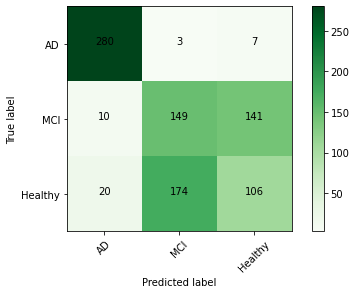

Normalized confusion matrix


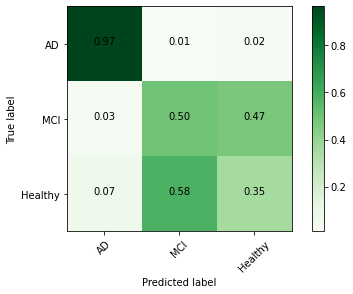

0.6011111111111112 accuracy
0.5762777777777778 precision
0.6055555555555555 recall
Pipeline(steps=[('selectpercentile', SelectPercentile(percentile=8)),
                ('extratreesclassifier',
                 ExtraTreesClassifier(max_features=0.5, min_samples_leaf=7,
                                      min_samples_split=20))]) Unique tpot
890 890
[[280   0  10]
 [  1 149 150]
 [  0  67 233]]
Confusion matrix, without normalization


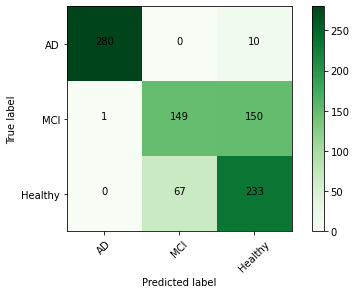

Normalized confusion matrix


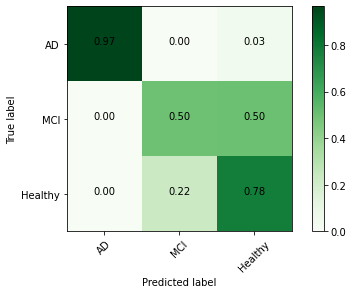

0.7438888888888888 accuracy
0.7492777777777777 precision
0.7466666666666666 recall
Pipeline(steps=[('selectpercentile', SelectPercentile(percentile=8)),
                ('extratreesclassifier',
                 ExtraTreesClassifier(max_features=0.5, min_samples_leaf=7,
                                      min_samples_split=20))]) Acoustic tpot
890 890
[[210  49  31]
 [  0 116 184]
 [ 30 209  61]]
Confusion matrix, without normalization


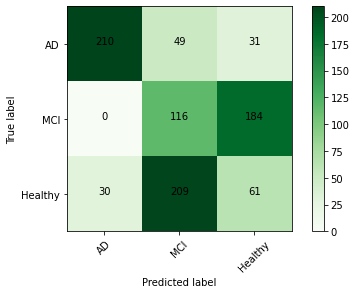

Normalized confusion matrix


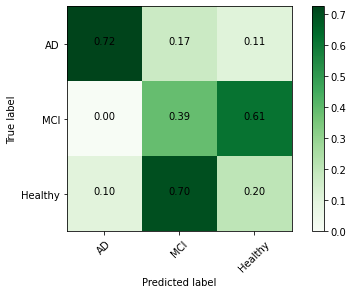

0.4369444444444444 accuracy
0.4453888888888889 precision
0.44111111111111106 recall
Pipeline(steps=[('selectpercentile', SelectPercentile(percentile=8)),
                ('extratreesclassifier',
                 ExtraTreesClassifier(max_features=0.5, min_samples_leaf=7,
                                      min_samples_split=20))]) FS1 tpot
890 890
[[280   0  10]
 [ 10 140 150]
 [ 10  45 245]]
Confusion matrix, without normalization


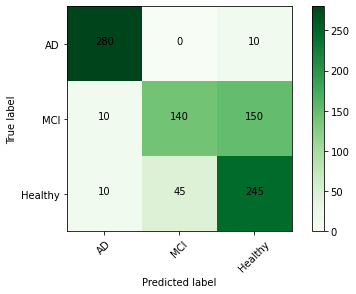

Normalized confusion matrix


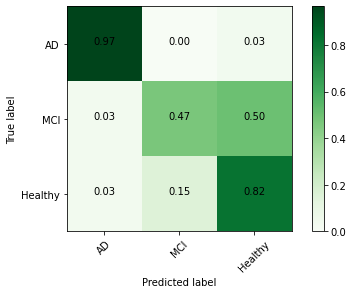

0.7472222222222222 accuracy
0.7484444444444444 precision
0.75 recall
Pipeline(steps=[('selectpercentile', SelectPercentile(percentile=8)),
                ('extratreesclassifier',
                 ExtraTreesClassifier(max_features=0.5, min_samples_leaf=7,
                                      min_samples_split=20))]) FS2 tpot
890 890
[[260  10  20]
 [ 10 145 145]
 [ 10 150 140]]
Confusion matrix, without normalization


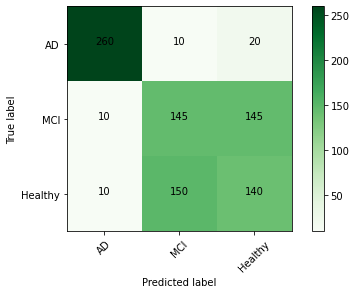

Normalized confusion matrix


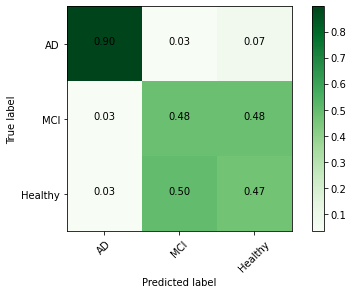

0.6125 accuracy
0.6216666666666666 precision
0.6166666666666666 recall
Pipeline(steps=[('selectpercentile', SelectPercentile(percentile=8)),
                ('extratreesclassifier',
                 ExtraTreesClassifier(max_features=0.5, min_samples_leaf=7,
                                      min_samples_split=20))]) FS3 tpot
890 890
[[280   0  10]
 [ 20 130 150]
 [ 20  70 210]]
Confusion matrix, without normalization


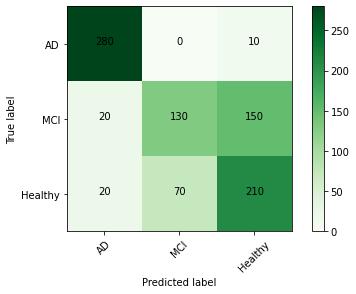

Normalized confusion matrix


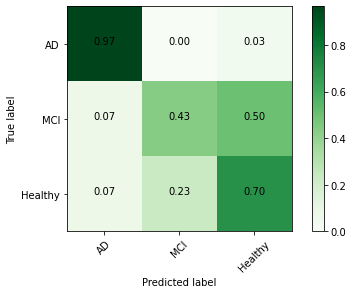

0.6972222222222222 accuracy
0.6944444444444444 precision
0.7 recall
Pipeline(steps=[('selectpercentile', SelectPercentile(percentile=8)),
                ('extratreesclassifier',
                 ExtraTreesClassifier(max_features=0.5, min_samples_leaf=7,
                                      min_samples_split=20))]) HuBERT tpot
890 890
[[258  14  18]
 [  1 177 122]
 [ 23 138 139]]
Confusion matrix, without normalization


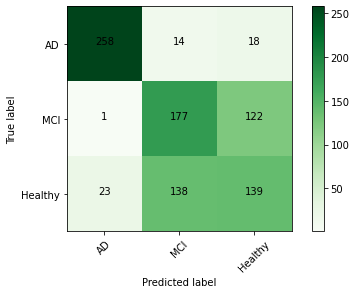

Normalized confusion matrix


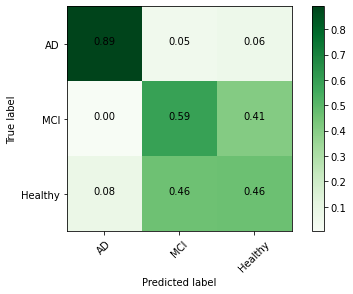

0.6443055555555556 accuracy
0.6671666666666666 precision
0.6488888888888888 recall


In [54]:
# TPOT multiclass Model Classifications


print(i, "Basic tpot")
kfold_and_score(normalized_BASIC, labels, tpot_basic_model, ["AD", "MCI", "Healthy"], splits, 10, "Basic")
print(i, "Unique tpot")
kfold_and_score(normalized_UNIQUE, labels, tpot_unique_model, ["AD", "MCI", "Healthy"], splits, 10, "Unique")
print(i, "Acoustic tpot")
kfold_and_score(normalized_ACOUSTIC, labels, tpot_acoustic_model, ["AD", "MCI", "Healthy"], splits, 10, "Acoustic")
print(i, "FS1 tpot")
kfold_and_score(normalized_FS_1, labels, tpot_fs1_model, ["AD", "MCI", "Healthy"], splits, 10, "FS1")
print(i, "FS2 tpot")
kfold_and_score(normalized_FS_2, labels, tpot_fs2_model, ["AD", "MCI", "Healthy"], splits, 10, "FS1")
print(i, "FS3 tpot")
kfold_and_score(normalized_FS_3, labels, tpot_fs3_model, ["AD", "MCI", "Healthy"], splits, 10, "FS3")
print(i, "HuBERT tpot")
kfold_and_score(HUBERT_FEATURES, labels, tpot_hubert_model, ["AD", "MCI", "Healthy"], splits, 10, "HuBERT")


c:\Users\EliKurtz\VSCode_files\NLP\Kurtz-NLP\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


590 590
[[270  20]
 [  0 300]]
Confusion matrix, without normalization


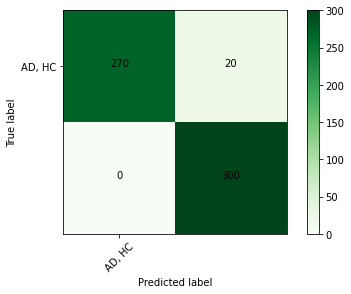

Normalized confusion matrix


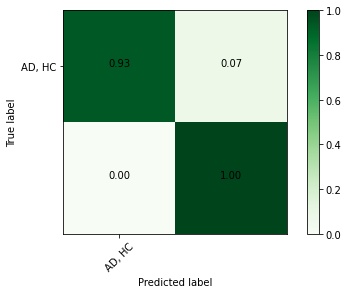

0.9666666666666667 accuracy
0.975 precision
0.9666666666666667 recall
590 590
[[280  10]
 [  0 300]]
Confusion matrix, without normalization


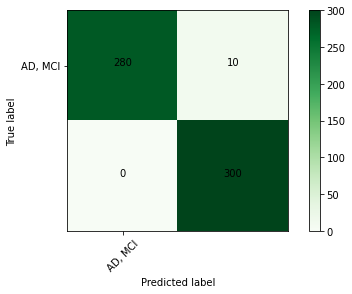

Normalized confusion matrix


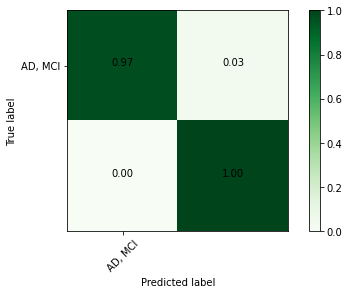

0.9833333333333334 accuracy
0.9875 precision
0.9833333333333333 recall
600 600
[[187 113]
 [132 168]]
Confusion matrix, without normalization


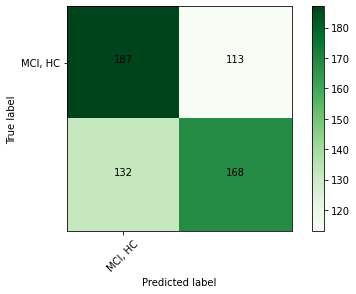

Normalized confusion matrix


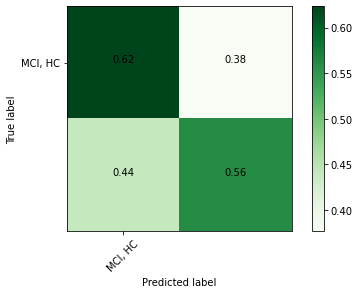

0.5916666666666667 accuracy
0.5810833333333333 precision
0.5916666666666667 recall


In [36]:
#TPOT binary model classification

kfold_and_score(avh_fs3_feature, avh_fs3_labels, tpot_binary_avh_model, ["AD, HC"], splits, 10, "tpot avh")

kfold_and_score(avm_fs3_feature, avm_fs3_labels, tpot_binary_avm_model, ["AD, MCI"], splits, 10, "tpot avm")

kfold_and_score(mvh_hubert_feature, mvh_hubert_labels, tpot_binary_mvh_model, ["MCI, HC"], splits, 10, "tpot mvh")

DecisionTreeClassifier(max_depth=3, min_samples_leaf=9, min_samples_split=9) Basic
[[280   0  10]
 [ 10 130 160]
 [ 20 150 130]]
Confusion matrix, without normalization


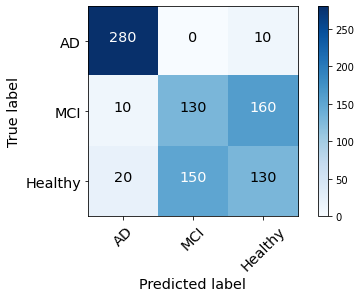

Normalized confusion matrix


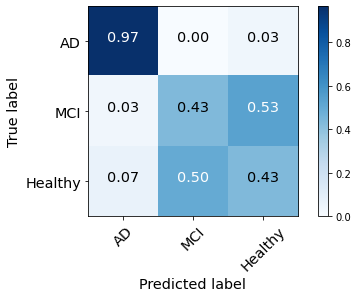

0.6055555555555555 accuracy
0.5698412698412698 precision
0.611111111111111 recall
DecisionTreeClassifier(max_depth=3, min_samples_leaf=9, min_samples_split=9) Unique
[[280   0  10]
 [ 10 196  94]
 [ 10 126 164]]
Confusion matrix, without normalization


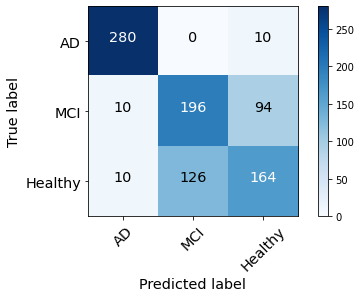

Normalized confusion matrix


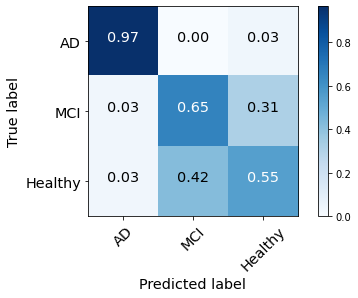

0.7195833333333334 accuracy
0.72 precision
0.7222222222222221 recall
DecisionTreeClassifier(max_depth=3, min_samples_leaf=9, min_samples_split=9) Acoustic
[[195   6  89]
 [ 30 153 117]
 [ 61 191  48]]
Confusion matrix, without normalization


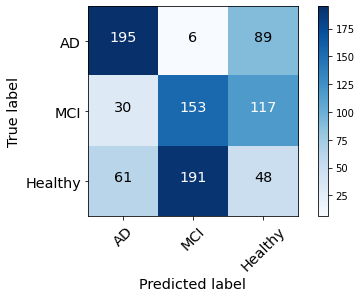

Normalized confusion matrix


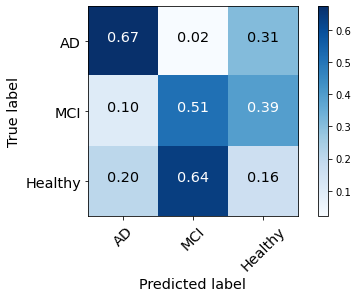

0.4469444444444444 accuracy
0.4502777777777777 precision
0.4511111111111111 recall
DecisionTreeClassifier(max_depth=3, min_samples_leaf=9, min_samples_split=9) FS1
[[280   0  10]
 [ 10 196  94]
 [ 10 153 137]]
Confusion matrix, without normalization


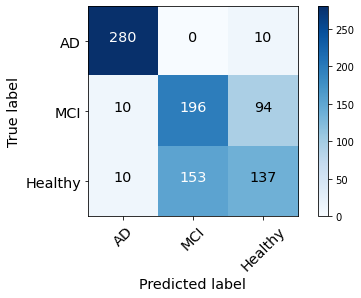

Normalized confusion matrix


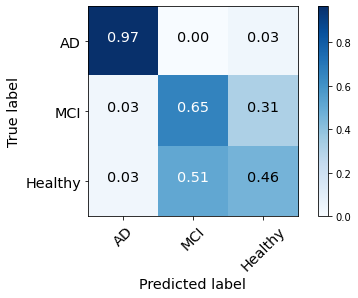

0.6877777777777778 accuracy
0.6725 precision
0.6922222222222222 recall
DecisionTreeClassifier(max_depth=3, min_samples_leaf=9, min_samples_split=9) FS2
[[280   0  10]
 [  4 176 120]
 [  2 190 108]]
Confusion matrix, without normalization


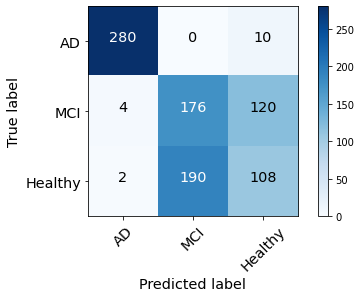

Normalized confusion matrix


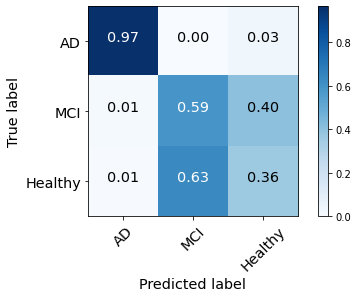

0.6330555555555556 accuracy
0.613 precision
0.6377777777777777 recall
DecisionTreeClassifier(max_depth=3, min_samples_leaf=9, min_samples_split=9) FS3
[[280  10   0]
 [ 10 133 157]
 [ 10  99 191]]
Confusion matrix, without normalization


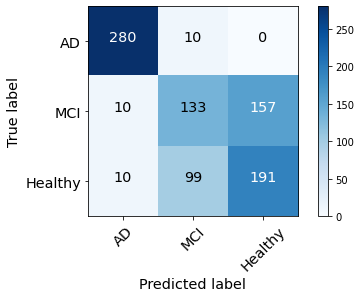

Normalized confusion matrix


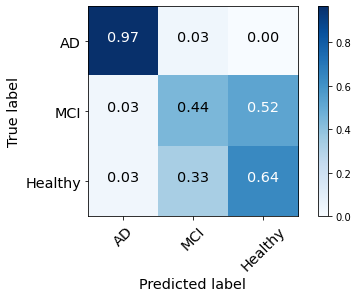

0.6777777777777778 accuracy
0.7100555555555556 precision
0.6822222222222222 recall
DecisionTreeClassifier(max_depth=3, min_samples_leaf=9, min_samples_split=9) HuBERT
[[180  70  40]
 [ 60 120 120]
 [ 80 110 110]]
Confusion matrix, without normalization


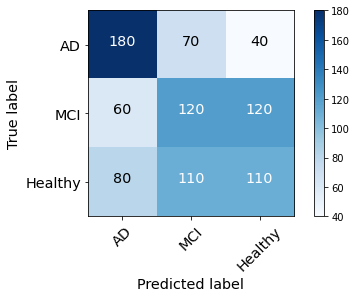

Normalized confusion matrix


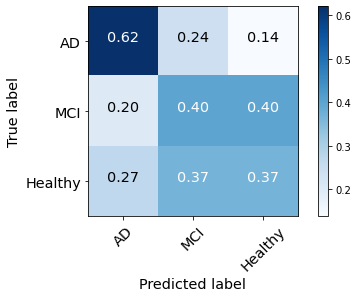

0.4638888888888889 accuracy
0.4472222222222222 precision
0.4666666666666666 recall
LinearDiscriminantAnalysis() Basic
[[270  20   0]
 [  0 200 100]
 [ 50 120 130]]
Confusion matrix, without normalization


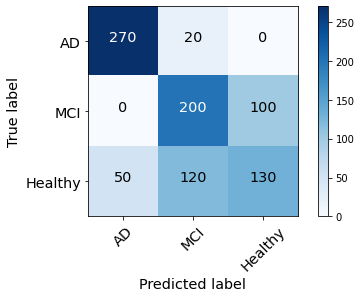

Normalized confusion matrix


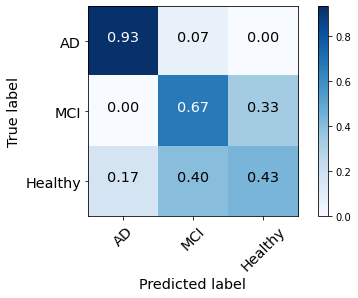

0.675 accuracy
0.6777777777777778 precision
0.6777777777777777 recall
LinearDiscriminantAnalysis() Unique
[[230  40  20]
 [ 40 150 110]
 [ 20 150 130]]
Confusion matrix, without normalization


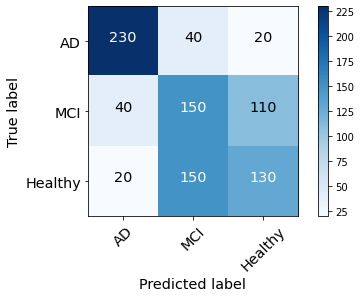

Normalized confusion matrix


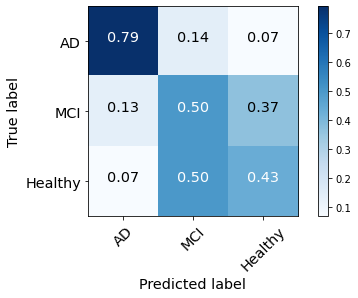

0.5722222222222222 accuracy
0.5977777777777777 precision
0.5777777777777777 recall
LinearDiscriminantAnalysis() Acoustic
[[190  50  50]
 [ 40 110 150]
 [110  60 130]]
Confusion matrix, without normalization


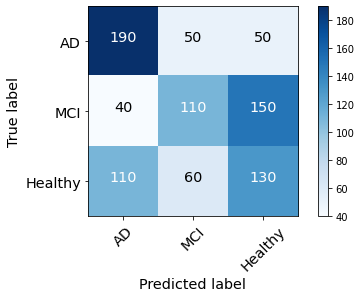

Normalized confusion matrix


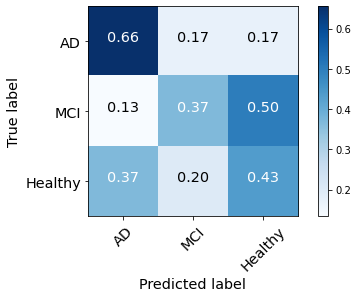

0.48333333333333334 accuracy
0.46928571428571425 precision
0.4833333333333333 recall
LinearDiscriminantAnalysis() FS1
[[280   0  10]
 [ 10 160 130]
 [ 20 110 170]]
Confusion matrix, without normalization


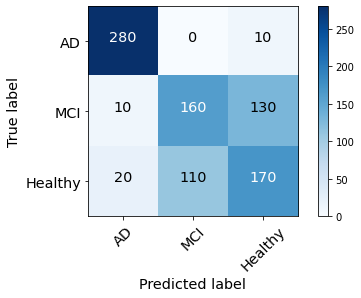

Normalized confusion matrix


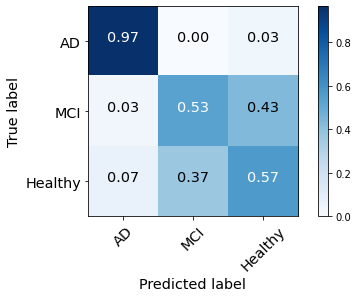

0.6847222222222222 accuracy
0.716111111111111 precision
0.6888888888888889 recall
LinearDiscriminantAnalysis() FS2
[[280  10   0]
 [  0 100 200]
 [ 20 190  90]]
Confusion matrix, without normalization


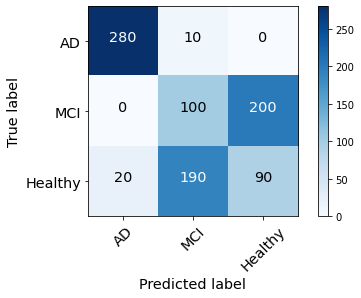

Normalized confusion matrix


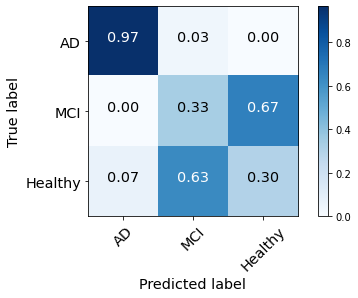

0.5305555555555556 accuracy
0.52 precision
0.5333333333333333 recall
LinearDiscriminantAnalysis() FS3
[[280   0  10]
 [  0 120 180]
 [ 30 170 100]]
Confusion matrix, without normalization


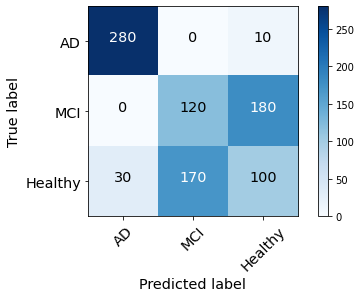

Normalized confusion matrix


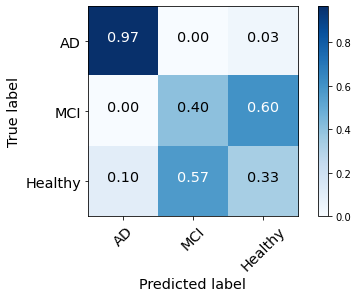

0.5597222222222222 accuracy
0.5377777777777778 precision
0.5666666666666667 recall
LinearDiscriminantAnalysis() HuBERT
[[250  20  20]
 [  0 150 150]
 [ 10 140 150]]
Confusion matrix, without normalization


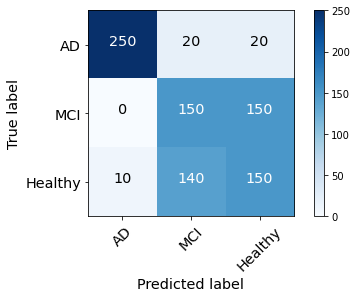

Normalized confusion matrix


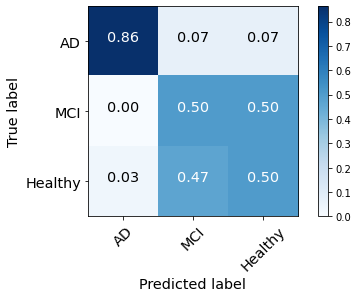

0.6194444444444445 accuracy
0.6477777777777778 precision
0.6222222222222221 recall
LinearSVC(C=0.1, tol=0.001) Basic
[[257  23  10]
 [ 10 230  60]
 [ 40 234  26]]
Confusion matrix, without normalization


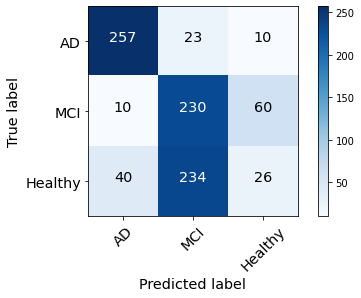

Normalized confusion matrix


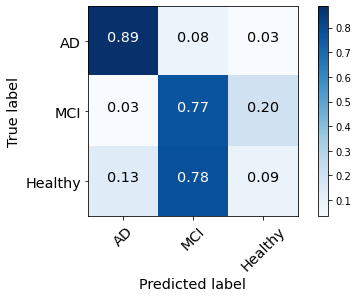

0.5755555555555556 accuracy
0.5116507936507937 precision
0.581111111111111 recall
LinearSVC(C=0.1, tol=0.001) Unique
[[280  10   0]
 [ 20 170 110]
 [ 30 130 140]]
Confusion matrix, without normalization


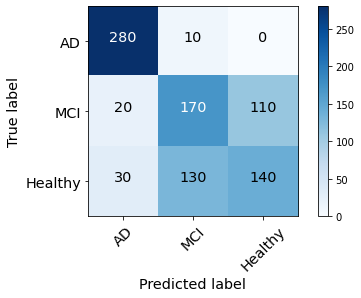

Normalized confusion matrix


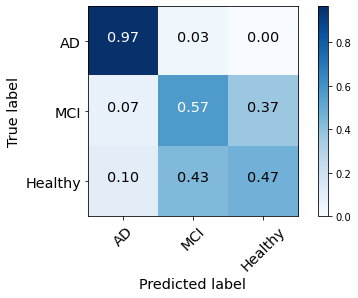

0.6611111111111111 accuracy
0.6761111111111111 precision
0.6666666666666666 recall
LinearSVC(C=0.1, tol=0.001) Acoustic
[[ 20 236  34]
 [  0 270  30]
 [ 10 280  10]]
Confusion matrix, without normalization


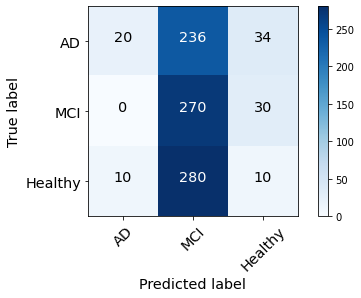

Normalized confusion matrix


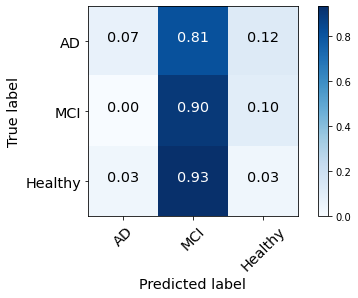

0.3402777777777778 accuracy
0.147 precision
0.34444444444444444 recall
LinearSVC(C=0.1, tol=0.001) FS1
[[280  10   0]
 [ 20 200  80]
 [ 30 130 140]]
Confusion matrix, without normalization


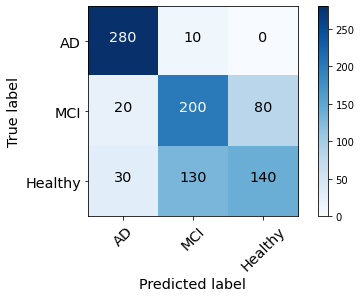

Normalized confusion matrix


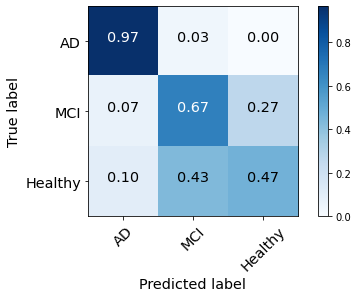

0.6972222222222222 accuracy
0.726111111111111 precision
0.7 recall
LinearSVC(C=0.1, tol=0.001) FS2
[[ 20 230  40]
 [  0 270  30]
 [ 10 280  10]]
Confusion matrix, without normalization


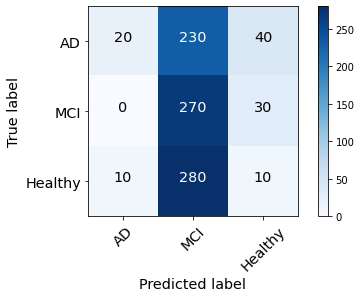

Normalized confusion matrix


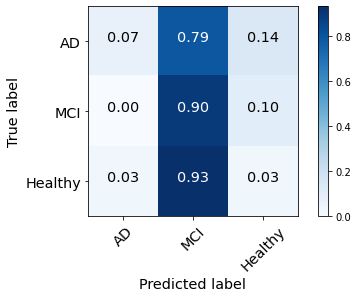

0.3402777777777778 accuracy
0.14833333333333332 precision
0.34444444444444444 recall
LinearSVC(C=0.1, tol=0.001) FS3
[[280  10   0]
 [ 20 200  80]
 [ 40 120 140]]
Confusion matrix, without normalization


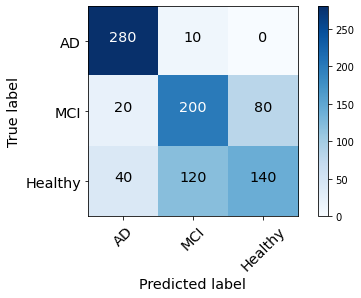

Normalized confusion matrix


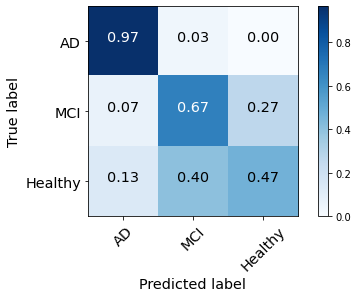

0.6972222222222222 accuracy
0.7255555555555555 precision
0.7 recall
LinearSVC(C=0.1, tol=0.001) HuBERT
[[230  50  10]
 [ 70 190  40]
 [ 80 120 100]]
Confusion matrix, without normalization


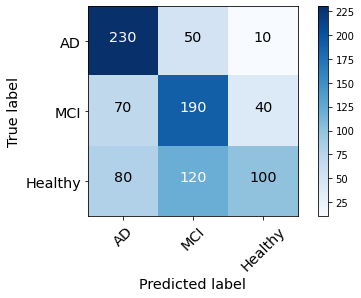

Normalized confusion matrix


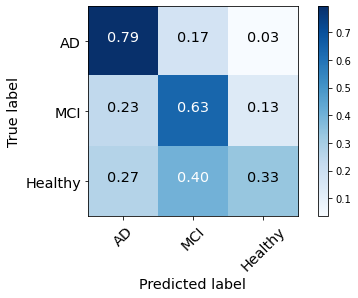

0.5861111111111111 accuracy
0.5827777777777777 precision
0.5888888888888888 recall
KNeighborsClassifier(n_neighbors=1) Basic
[[250   0  40]
 [  0  90 210]
 [ 10 170 120]]
Confusion matrix, without normalization


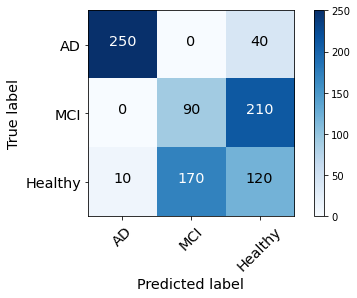

Normalized confusion matrix


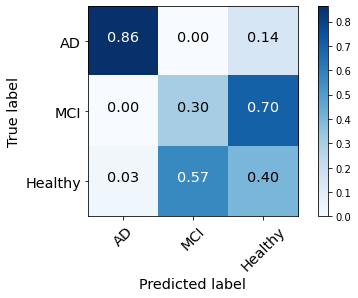

0.5166666666666667 accuracy
0.5333333333333333 precision
0.5222222222222221 recall
KNeighborsClassifier(n_neighbors=1) Unique
[[280   0  10]
 [ 10 110 180]
 [ 20 220  60]]
Confusion matrix, without normalization


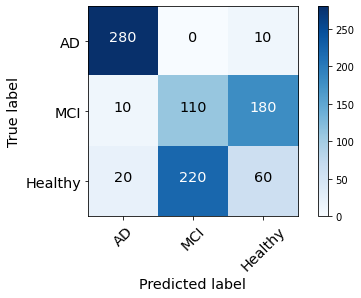

Normalized confusion matrix


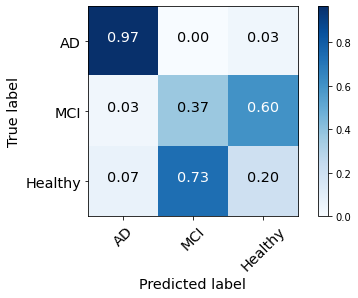

0.5055555555555555 accuracy
0.46777777777777774 precision
0.5111111111111111 recall
KNeighborsClassifier(n_neighbors=1) Acoustic
[[100  60 130]
 [ 40 130 130]
 [ 60 140 100]]
Confusion matrix, without normalization


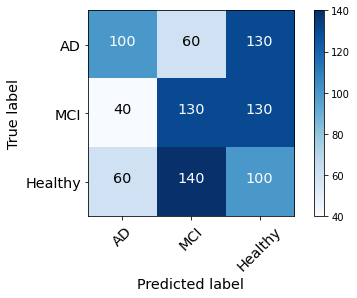

Normalized confusion matrix


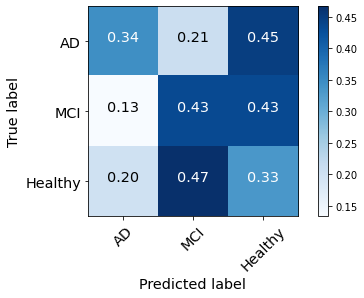

0.37083333333333335 accuracy
0.35507936507936505 precision
0.36666666666666664 recall
KNeighborsClassifier(n_neighbors=1) FS1
[[280   0  10]
 [ 10  90 200]
 [ 10 220  70]]
Confusion matrix, without normalization


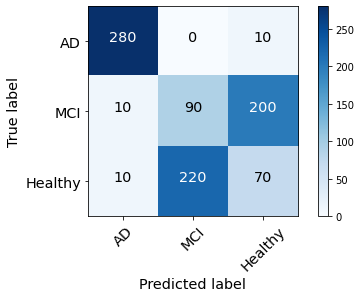

Normalized confusion matrix


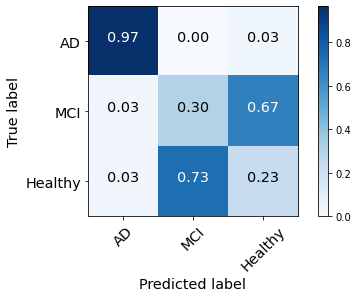

0.49444444444444446 accuracy
0.4622222222222222 precision
0.49999999999999994 recall
KNeighborsClassifier(n_neighbors=1) FS2
[[130  50 110]
 [  0 140 160]
 [ 40 150 110]]
Confusion matrix, without normalization


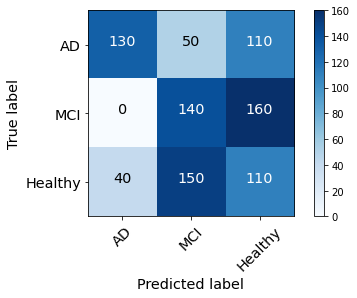

Normalized confusion matrix


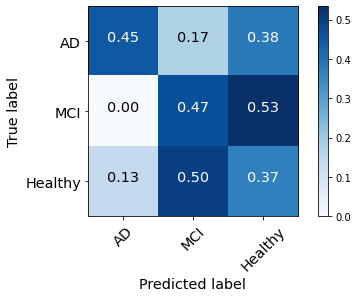

0.42777777777777776 accuracy
0.4589682539682539 precision
0.42777777777777776 recall
KNeighborsClassifier(n_neighbors=1) FS3
[[280   0  10]
 [ 10 110 180]
 [ 10 220  70]]
Confusion matrix, without normalization


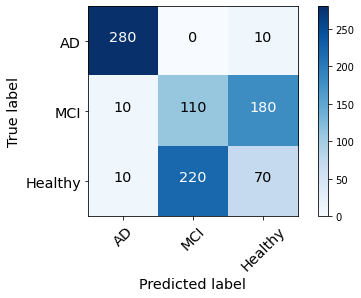

Normalized confusion matrix


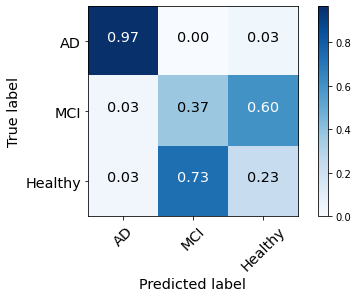

0.5166666666666667 accuracy
0.47888888888888886 precision
0.5222222222222221 recall
KNeighborsClassifier(n_neighbors=1) HuBERT
[[150  90  50]
 [ 20 160 120]
 [ 20 130 150]]
Confusion matrix, without normalization


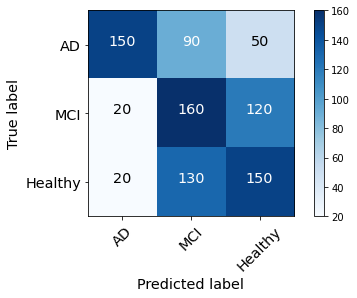

Normalized confusion matrix


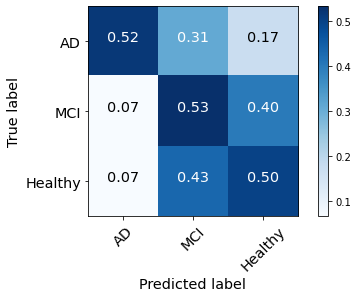

0.5166666666666666 accuracy
0.5403968253968254 precision
0.5166666666666666 recall
RandomForestClassifier() Basic
[[273   4  13]
 [  0 136 164]
 [ 24 212  64]]
Confusion matrix, without normalization


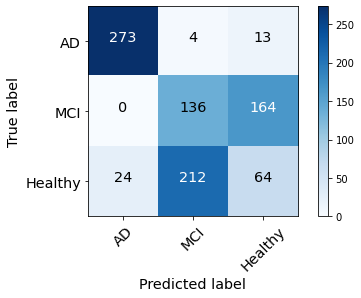

Normalized confusion matrix


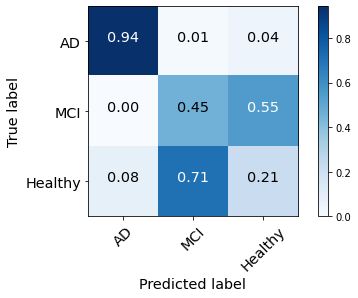

0.5298611111111111 accuracy
0.5038571428571428 precision
0.5366666666666666 recall
RandomForestClassifier() Unique
[[280   0  10]
 [ 10 146 144]
 [ 10 124 166]]
Confusion matrix, without normalization


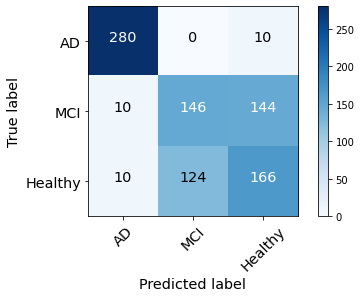

Normalized confusion matrix


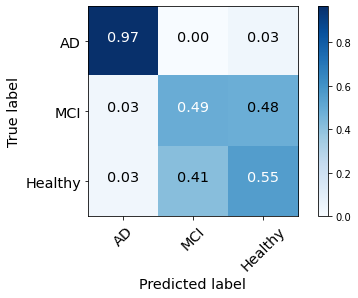

0.6658333333333334 accuracy
0.6482222222222221 precision
0.6688888888888889 recall
RandomForestClassifier() Acoustic
[[221  48  21]
 [  0 158 142]
 [ 38 173  89]]
Confusion matrix, without normalization


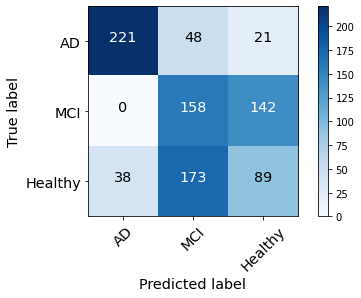

Normalized confusion matrix


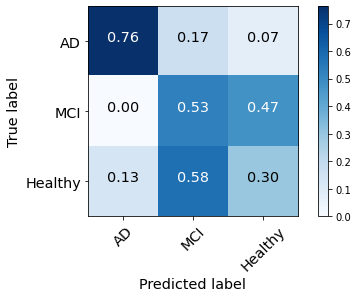

0.5263888888888889 accuracy
0.5376507936507936 precision
0.5311111111111111 recall
RandomForestClassifier() FS1
[[280   1   9]
 [ 10 151 139]
 [ 10 151 139]]
Confusion matrix, without normalization


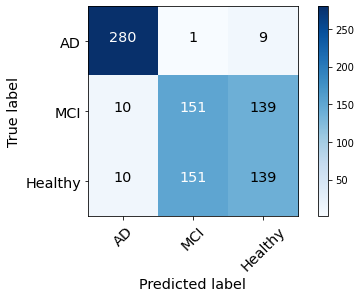

Normalized confusion matrix


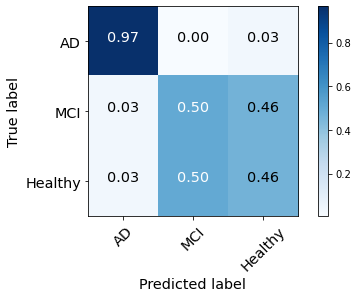

0.6408333333333334 accuracy
0.6216666666666666 precision
0.6444444444444444 recall
RandomForestClassifier() FS2
[[280   7   3]
 [  1 175 124]
 [  1 165 134]]
Confusion matrix, without normalization


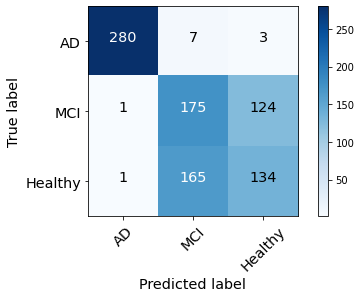

Normalized confusion matrix


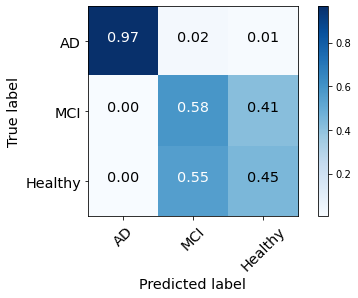

0.6606944444444445 accuracy
0.6575 precision
0.6655555555555555 recall
RandomForestClassifier() FS3
[[280  10   0]
 [ 10 201  89]
 [ 10 121 169]]
Confusion matrix, without normalization


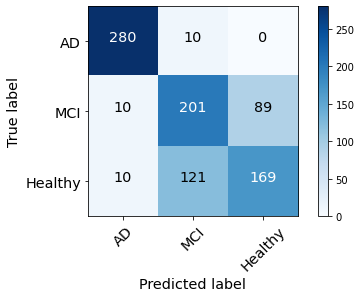

Normalized confusion matrix


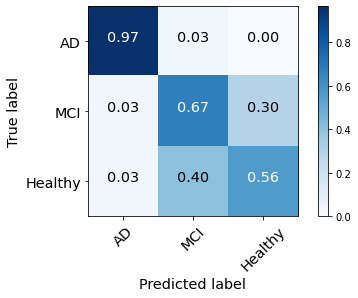

0.7316666666666667 accuracy
0.7468333333333333 precision
0.7333333333333333 recall
RandomForestClassifier() HuBERT
[[226  36  28]
 [ 39 169  92]
 [ 52  92 156]]
Confusion matrix, without normalization


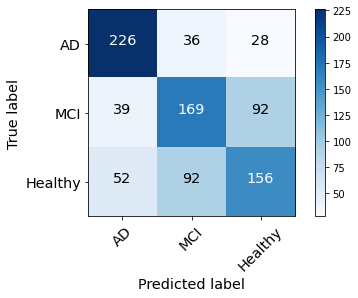

Normalized confusion matrix


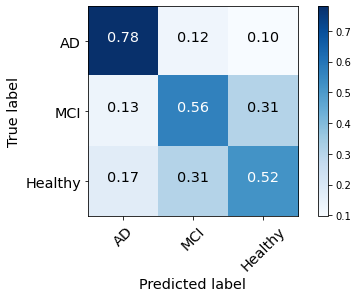

0.6213888888888889 accuracy
0.6185396825396825 precision
0.6233333333333333 recall


In [56]:
# Default Model Classifications

for i in models:
    print(i, "Basic")
    kfold_and_score(normalized_BASIC, labels, i, ["AD", "MCI", "Healthy"], splits, 10, "Basic" + str(i))
    print(i, "Unique")
    kfold_and_score(normalized_UNIQUE, labels, i, ["AD", "MCI", "Healthy"], splits, 10, "Unique" + str(i))
    print(i, "Acoustic")
    kfold_and_score(normalized_ACOUSTIC, labels, i, ["AD", "MCI", "Healthy"], splits, 10, "Acoustic" + str(i))
    print(i, "FS1")
    kfold_and_score(normalized_FS_1, labels, i, ["AD", "MCI", "Healthy"], splits, 10, "FS1" + str(i))
    # FS1 = Feature set 1, FS2 = Feature set 2
    print(i, "FS2")
    kfold_and_score(normalized_FS_2, labels, i, ["AD", "MCI", "Healthy"], splits, 10, "FS2" + str(i))
    print(i, "FS3")
    kfold_and_score(normalized_FS_3, labels, i, ["AD", "MCI", "Healthy"], splits, 10, "FS3" + str(i))
    print(i, "HuBERT")
    kfold_and_score(HUBERT_FEATURES, labels, i, ["AD", "MCI", "Healthy"], splits, 10, "HuBERT" + str(i))
    

**Binary Classification**

In [ ]:
for i in range(len(binary_model_features)):
    print(i)
    print(binary_class_features[i], "DT", binary_class_labels[i])
    kfold_and_score(binary_model_features[i], binary_model_labels[i], dt_model, binary_class_labels[i], splits, 10, "DT")
    print(binary_class_features[i], "LDA", binary_class_labels[i])
    kfold_and_score(binary_model_features[i], binary_model_labels[i], lda_model, binary_class_labels[i], splits, 10, "LDA")
    print(binary_class_features[i], "SVM", binary_class_labels[i])
    kfold_and_score(binary_model_features[i], binary_model_labels[i], svm_model, binary_class_labels[i], splits, 10, "SVM")
    print(binary_class_features[i], "KNN", binary_class_labels[i])
    kfold_and_score(binary_model_features[i], binary_model_labels[i], nn_model, binary_class_labels[i], splits, 10, "KNN")
    print(binary_class_features[i], "RF", binary_class_labels[i])
    kfold_and_score(binary_model_features[i], binary_model_labels[i], rf_model, binary_class_labels[i], splits, 10, "RF")


**Regression:**

In [28]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.linear_model import ElasticNetCV, Ridge, LassoLarsCV, SGDRegressor
from xgboost import XGBRegressor
from sklearn.feature_selection import SelectFwe, f_regression
from sklearn.svm import LinearSVR
from sklearn.ensemble import ExtraTreesRegressor, AdaBoostRegressor, GradientBoostingRegressor


In [29]:
dtr_model = DecisionTreeRegressor()
svr_model = SVR()
ridge_model = Ridge()

tpot_regression_basic_model = make_pipeline(
    StackingEstimator(estimator=LinearSVR(C=0.0001, dual=True, epsilon=1.0, loss="epsilon_insensitive", tol=0.001)),
    SelectFwe(score_func=f_regression, alpha=0.037),
    MinMaxScaler(),
    StackingEstimator(estimator=DecisionTreeRegressor(max_depth=8, min_samples_leaf=18, min_samples_split=9)),
    XGBRegressor(learning_rate=0.1, max_depth=3, min_child_weight=2, n_estimators=100, n_jobs=1, objective="reg:squarederror", subsample=0.7500000000000001, verbosity=0)
)

tpot_regression_unique_model = make_pipeline(
    StackingEstimator(estimator=XGBRegressor(learning_rate=1.0, max_depth=7, min_child_weight=19, n_estimators=100, n_jobs=1, objective="reg:squarederror", subsample=0.25, verbosity=0)),
    Normalizer(norm="max"),
    ExtraTreesRegressor(bootstrap=False, max_features=0.6500000000000001, min_samples_leaf=2, min_samples_split=3, n_estimators=100)
)

tpot_regression_acoustic_model = make_pipeline(
    PolynomialFeatures(degree=2, include_bias=False, interaction_only=False),
    StackingEstimator(estimator=ExtraTreesRegressor(bootstrap=True, max_features=0.8, min_samples_leaf=18, min_samples_split=15, n_estimators=100)),
    StackingEstimator(estimator=XGBRegressor(learning_rate=0.001, max_depth=10, min_child_weight=16, n_estimators=100, n_jobs=1, objective="reg:squarederror", subsample=0.4, verbosity=0)),
    AdaBoostRegressor(learning_rate=1.0, loss="square", n_estimators=100)
)

tpot_regression_fs1_model = make_pipeline(
    Normalizer(norm="max"),
    StackingEstimator(estimator=DecisionTreeRegressor(max_depth=6, min_samples_leaf=4, min_samples_split=2)),
    StackingEstimator(estimator=ElasticNetCV(l1_ratio=0.55, tol=0.001)),
    ExtraTreesRegressor(bootstrap=False, max_features=0.4, min_samples_leaf=4, min_samples_split=7, n_estimators=100)
)

tpot_regression_fs2_model = make_pipeline(
    PolynomialFeatures(degree=2, include_bias=False, interaction_only=False),
    StackingEstimator(estimator=LassoLarsCV(normalize=True)),
    StackingEstimator(estimator=SGDRegressor(alpha=0.01, eta0=1.0, fit_intercept=False, l1_ratio=0.5, learning_rate="invscaling", loss="epsilon_insensitive", penalty="elasticnet", power_t=1.0)),
    GradientBoostingRegressor(alpha=0.9, learning_rate=0.5, loss="huber", max_depth=4, max_features=0.35000000000000003, min_samples_leaf=4, min_samples_split=13, n_estimators=100, subsample=1.0)
)

tpot_regression_fs3_model = make_pipeline(
    Normalizer(norm="max"),
    LassoLarsCV(normalize=True)
)

tpot_regression_hubert_model = make_pipeline(
    Normalizer(norm="max"),
    ElasticNetCV(l1_ratio=0.8500000000000001, tol=1e-05)
)

models_regression = [dtr_model, svr_model, ridge_model]
splits = 10

In [157]:

for i in models_regression:
    print(i, "BASIC")
    kfold_and_mse(normalized_BASIC, regression_labels, i, splits, 10)
    print(i, "UNIQUE")
    kfold_and_mse(normalized_UNIQUE, regression_labels, i, splits, 10)
    print(i, "ACOUSTIC")
    kfold_and_mse(normalized_ACOUSTIC, regression_labels, i, splits, 10)
    print(i, "FS1")
    kfold_and_mse(normalized_FS_1, regression_labels, i, splits, 10)
    print(i, "FS2")
    kfold_and_mse(normalized_FS_2, regression_labels, i, splits, 10)
    print(i, "FS3")
    kfold_and_mse(normalized_FS_3, regression_labels, i, splits, 10)
    print(i, "HUBERT")
    kfold_and_mse(HUBERT_FEATURES, regression_labels, i, splits, 10)

DecisionTreeRegressor() BASIC
[8.11111111111111, 16.70138888888889, 26.0, 23.145833333333332, 9.444444444444445, 26.666666666666668, 22.27138888888889, 54.655833333333334, 59.92052469135802, 26.203125, 11.777777777777779, 16.70138888888889, 31.88888888888889, 23.145833333333332, 8.11111111111111, 27.555555555555557, 26.60472222222222, 54.655833333333334, 59.92052469135802, 26.203125, 13.555555555555555, 16.70138888888889, 26.11111111111111, 22.8125, 8.555555555555555, 53.333333333333336, 23.27138888888889, 49.3225, 66.69830246913581, 24.828125, 17.555555555555557, 16.70138888888889, 26.0, 23.145833333333332, 9.444444444444445, 52.22222222222222, 21.3825, 54.655833333333334, 59.78472222222222, 24.828125, 13.555555555555555, 16.70138888888889, 26.333333333333332, 15.92361111111111, 9.777777777777779, 45.666666666666664, 22.3825, 51.98916666666666, 80.03163580246914, 22.953125, 6.444444444444445, 16.70138888888889, 28.22222222222222, 23.368055555555557, 9.444444444444445, 29.2222222222222

In [69]:
print(i, "Basic tpot regression")
kfold_and_mse(normalized_BASIC, regression_labels, tpot_regression_basic_model, splits, 10)
print(i, "Unique tpot regression")
kfold_and_mse(normalized_UNIQUE, regression_labels, tpot_regression_unique_model, splits, 10)
print(i, "Acoustic tpot regression")
kfold_and_mse(normalized_ACOUSTIC, regression_labels, tpot_regression_acoustic_model, splits, 10)
print(i, "FS1 tpot regression")
kfold_and_mse(normalized_FS_1, regression_labels, tpot_regression_fs1_model, splits, 10)
print(i, "FS2 tpot regression")
kfold_and_mse(normalized_FS_2, regression_labels, tpot_regression_fs2_model, splits, 10)
print(i, "FS3 tpot regression")
kfold_and_mse(normalized_FS_3, regression_labels, tpot_regression_fs3_model, splits, 10)
print(i, "HuBERT tpot regression")
kfold_and_mse(HUBERT_FEATURES, regression_labels, tpot_regression_hubert_model, splits, 10)

6 Basic tpot regression
[20.824340695623405, 10.934107891261394, 12.905400567156498, 18.53097315315851, 12.69737964886503, 30.527870350411124, 10.021608516474064, 21.964053756403093, 18.476081621523917, 28.151325477862883, 20.824340695623405, 10.934107891261394, 12.905400567156498, 18.53097315315851, 12.69737964886503, 30.527870350411124, 10.021608516474064, 21.964053756403093, 18.476081621523917, 28.151325477862883, 20.824340695623405, 10.934107891261394, 12.905400567156498, 18.53097315315851, 12.69737964886503, 30.527870350411124, 10.021608516474064, 21.964053756403093, 18.476081621523917, 28.151325477862883, 20.824340695623405, 10.934107891261394, 12.905400567156498, 18.53097315315851, 12.69737964886503, 30.527870350411124, 10.021608516474064, 21.964053756403093, 18.476081621523917, 28.151325477862883, 20.824340695623405, 10.934107891261394, 12.905400567156498, 18.53097315315851, 12.69737964886503, 30.527870350411124, 10.021608516474064, 21.964053756403093, 18.476081621523917, 28.15

c:\Users\EliKurtz\VSCode_files\NLP\Kurtz-NLP\lib\site-packages\sklearn\linear_model\_least_angle.py:649: ConvergenceWarning: Regressors in active set degenerate. Dropping a regressor, after 75 iterations, i.e. alpha=4.023e-02, with an active set of 37 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
  warnings.warn(
c:\Users\EliKurtz\VSCode_files\NLP\Kurtz-NLP\lib\site-packages\sklearn\linear_model\_least_angle.py:649: ConvergenceWarning: Regressors in active set degenerate. Dropping a regressor, after 110 iterations, i.e. alpha=2.371e-02, with an active set of 42 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
  warnings.warn(
c:\Users\EliKurtz\VSCode_files\NLP\Kurtz-NLP\lib\site-packages\sklearn\linear_model\_least_angle.py:649: ConvergenceWarning: Regressors in active set degenerate. Dropping a regressor, after 142 iterations, i.e. alpha=2.012e-02, with an

[18.198326259478, 9.572895799361994, 25.007170779029277, 11.932332475646987, 13.722593458460228, 34.18675083956534, 14.501912690900813, 41.025464975649705, 22.705769528158775, 20.653076185985338, 21.749731277362017, 3.6356955671564446, 30.348887997285107, 7.428986612466986, 22.715134058005464, 30.924864113480307, 26.97794244705483, 40.517123443828304, 15.987593395546899, 34.193617821018336, 13.81993681903311, 3.909819949323178, 39.83788551382416, 4.3849898195502535, 22.71464362299291, 33.16298613311004, 18.287452424291338, 32.253917451195, 17.66870923963832, 24.643287296118835, 9.305220771346118, 9.869124704780852, 40.366062467295926, 3.0348059961485916, 24.982459937565636, 31.33482919719089, 15.941238542184598, 32.304561212521186, 23.324794131218066, 32.223153225686595, 15.367887945395442, 12.69050563029384, 23.946578945545923, 9.207463498509956, 21.93568227555358, 39.60556991130571, 10.268148032700616, 26.931099358872014, 16.15041055127303, 23.443447119183645, 9.606744399493552, 11.4

c:\Users\EliKurtz\VSCode_files\NLP\Kurtz-NLP\lib\site-packages\sklearn\linear_model\_least_angle.py:649: ConvergenceWarning: Regressors in active set degenerate. Dropping a regressor, after 20 iterations, i.e. alpha=3.710e-02, with an active set of 20 regressors, and the smallest cholesky pivot element being 3.650e-08. Reduce max_iter or increase eps parameters.
  warnings.warn(
c:\Users\EliKurtz\VSCode_files\NLP\Kurtz-NLP\lib\site-packages\sklearn\linear_model\_least_angle.py:649: ConvergenceWarning: Regressors in active set degenerate. Dropping a regressor, after 189 iterations, i.e. alpha=1.229e-02, with an active set of 53 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
  warnings.warn(
c:\Users\EliKurtz\VSCode_files\NLP\Kurtz-NLP\lib\site-packages\sklearn\linear_model\_least_angle.py:679: ConvergenceWarning: Early stopping the lars path, as the residues are small and the current value of alpha is no longer well contr

[19.219971438452706, 9.01722094869233, 15.344879211147612, 14.651061049534624, 94.14205785114251, 33.16035361991375, 16.479903373060054, 30.415308850047364, 15.125455091597397, 18.713718359780902, 19.219971438452706, 9.01722094869233, 15.344879211147612, 14.651061049534624, 94.14205785114251, 33.16035361991375, 16.479903373060054, 30.415308850047364, 15.125455091597397, 18.713718359780902, 19.219971438452706, 9.01722094869233, 15.344879211147612, 14.651061049534624, 94.14205785114251, 33.16035361991375, 16.479903373060054, 30.415308850047364, 15.125455091597397, 18.713718359780902, 19.219971438452706, 9.01722094869233, 15.344879211147612, 14.651061049534624, 94.14205785114251, 33.16035361991375, 16.479903373060054, 30.415308850047364, 15.125455091597397, 18.713718359780902, 19.219971438452706, 9.01722094869233, 15.344879211147612, 14.651061049534624, 94.14205785114251, 33.16035361991375, 16.479903373060054, 30.415308850047364, 15.125455091597397, 18.713718359780902, 19.219971438452706,

c:\Users\EliKurtz\VSCode_files\NLP\Kurtz-NLP\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.095e-02, tolerance: 1.154e-02
  model = cd_fast.enet_coordinate_descent(
c:\Users\EliKurtz\VSCode_files\NLP\Kurtz-NLP\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.903e-02, tolerance: 1.154e-02
  model = cd_fast.enet_coordinate_descent(
c:\Users\EliKurtz\VSCode_files\NLP\Kurtz-NLP\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider

In [ ]:
kfold_and_mse(HUBERT_FEATURES, regression_labels, tpot_regression_hubert_model, splits, 10)

**TPOT Fitting:**

In [31]:
pipeline_optimizer = TPOTClassifier(max_time_mins=60)
regression_optimizer = TPOTRegressor(max_time_mins=60)
os.chdir("..")  
os.chdir("..")  

In [38]:
pipeline_optimizer.fit(np.array(f_hubert_train), np.array(l_hubert_train))
pipeline_optimizer.export("TPOT_Classifier_(Full, 60 min)_HuBERT.py")

In [26]:
tpot_labels = ["basic", "unique", "acoustic", "fs1", "fs2", "fs3", "hubert"]
tpot_labels_binary = ["Basic", "FS3", "Hubert"]

In [45]:
for i in range(7):
    pipeline_optimizer.fit(np.array(training_data_full[i][0]), np.array(training_data_full[i][1]))
    pipeline_optimizer.export("TPOT_Classifier_(Full, 60 min)_" + tpot_labels[i] + ".py")
    

In [60]:
for i in range(7):
    regression_optimizer.fit(np.array(training_data_full_regression[i][0]), np.array(training_data_full_regression[i][1]))
    regression_optimizer.export("TPOT_Regressor_(Full, 60 min)_" + tpot_labels[i] + ".py")
    


In [28]:
for i in range(3):
    pipeline_optimizer.fit(np.array(training_data_full_binary[i][0]), np.array(training_data_full_binary[i][1]))
    pipeline_optimizer.export("TPOT_Binary_Classifier_(Full, 60 min)_" + tpot_labels_binary[i] + ".py")


In [32]:
pipeline_optimizer.fit(np.array(avh_train), np.array(avh_train_labels))

TPOTClassifier(max_time_mins=60)

In [33]:
pipeline_optimizer.export("TPOT avh.py")